2026-05-06 09:38:37.142636: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2026-05-06 09:38:37.142824: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2026-05-06 09:38:37.142836: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2026-05-06 09:38:37.143304: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2026-05-06 09:38:37.143318: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


[SUCCESS] Model 'models/model_variety_best.h5' berhasil dimuat.
[INFO] Memproses 9 gambar...


2026-05-06 09:38:38.522916: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


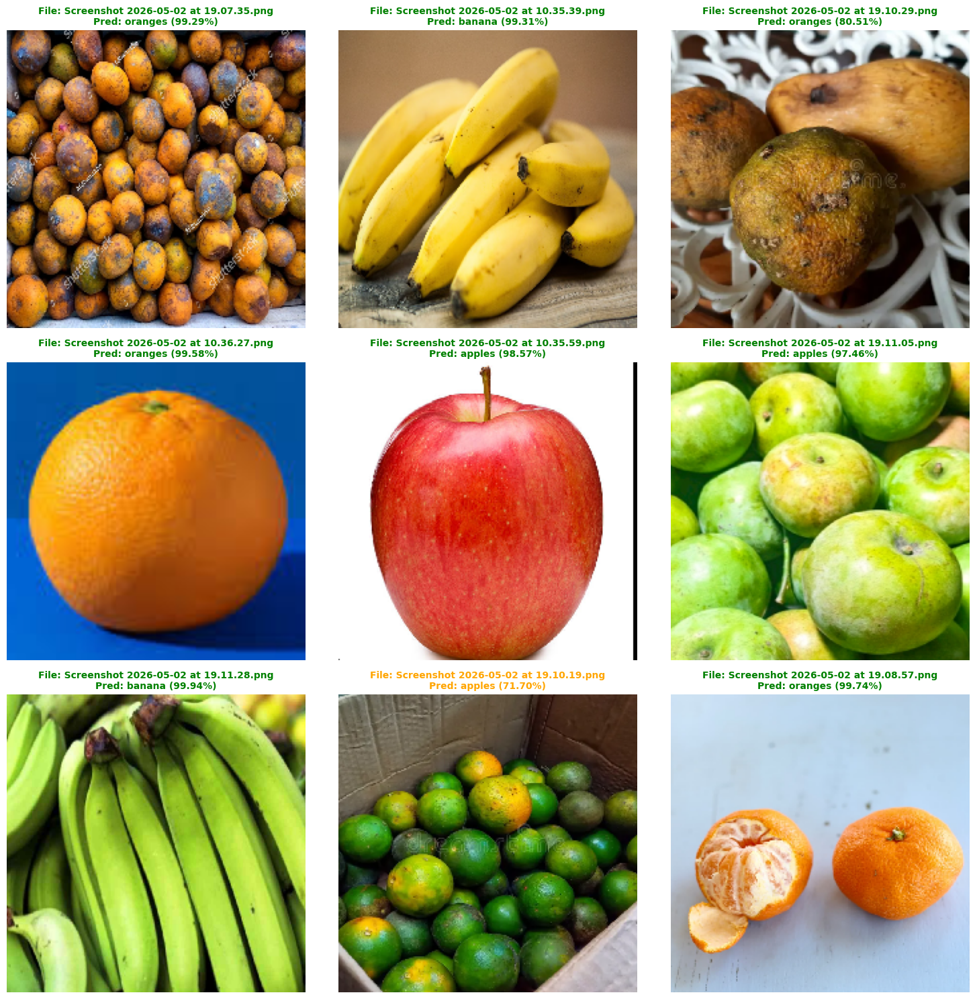


FILE NAME                      | PREDICTION      | CONFIDENCE
------------------------------------------------------------
Screenshot 2026-05-02 at 19.07 | oranges         | 99.29%
Screenshot 2026-05-02 at 10.35 | banana          | 99.31%
Screenshot 2026-05-02 at 19.10 | oranges         | 80.51%
Screenshot 2026-05-02 at 10.36 | oranges         | 99.58%
Screenshot 2026-05-02 at 10.35 | apples          | 98.57%
Screenshot 2026-05-02 at 19.11 | apples          | 97.46%
Screenshot 2026-05-02 at 19.11 | banana          | 99.94%
Screenshot 2026-05-02 at 19.10 | apples          | 71.70%
Screenshot 2026-05-02 at 19.08 | oranges         | 99.74%


In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math

# --- 1. KONFIGURASI ---
MODEL_PATH = 'models/model_variety_best.h5'
TEST_IMAGE_DIR = 'test_real_world/'
IMG_SIZE = (224, 224)
CLASS_LABELS = ['apples', 'banana', 'oranges']
COLUMNS = 3 # Jumlah gambar ke samping

# --- 2. LOAD MODEL ---
if os.path.exists(MODEL_PATH):
    model = tf.keras.models.load_model(MODEL_PATH)
    print(f"[SUCCESS] Model '{MODEL_PATH}' berhasil dimuat.")
else:
    print(f"[ERROR] File model tidak ditemukan!")

# --- 3. EKSEKUSI PENGUJIAN & VISUALISASI GRID ---
test_files = [f for f in os.listdir(TEST_IMAGE_DIR) if f.endswith(('.jpg', '.png', '.jpeg', '.avif'))]

if len(test_files) == 0:
    print("[WARNING] Folder test_real_world kosong. Masukkan gambar terlebih dahulu.")
else:
    num_images = len(test_files)
    rows = math.ceil(num_images / COLUMNS)
    
    # Setup Figure secara proporsional
    fig, axes = plt.subplots(rows, COLUMNS, figsize=(15, 5 * rows))
    axes = axes.flatten() if num_images > 1 else [axes] # Handle jika hanya 1 gambar
    
    print(f"[INFO] Memproses {num_images} gambar...")

    for i, file in enumerate(test_files):
        img_path = os.path.join(TEST_IMAGE_DIR, file)
        
        # Preprocessing sesuai standar MobileNetV2
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=IMG_SIZE)
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0
        
        # Inferensi (verbose=0 agar log tidak mengganggu tampilan)
        predictions = model.predict(img_array, verbose=0)
        result_label = CLASS_LABELS[np.argmax(predictions)]
        confidence = np.max(predictions) * 100
        
        # Plot ke Grid dengan indikator warna
        axes[i].imshow(img)
        color = 'green' if confidence > 80 else 'orange'
        axes[i].set_title(f"File: {file}\nPred: {result_label} ({confidence:.2f}%)", 
                          fontsize=10, color=color, fontweight='bold')
        axes[i].axis('off')

    # Sembunyikan sisa kotak kosong pada grid
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 4. RINGKASAN TABEL TEKS ---
    print("\n" + "="*60)
    print(f"{'FILE NAME':<30} | {'PREDICTION':<15} | {'CONFIDENCE'}")
    print("-"*60)
    for file in test_files:
        img_temp = tf.keras.preprocessing.image.load_img(os.path.join(TEST_IMAGE_DIR, file), target_size=IMG_SIZE)
        arr_temp = np.expand_dims(tf.keras.preprocessing.image.img_to_array(img_temp), axis=0) / 255.0
        res_temp = model.predict(arr_temp, verbose=0)
        print(f"{file[:30]:<30} | {CLASS_LABELS[np.argmax(res_temp)]:<15} | {np.max(res_temp)*100:.2f}%")
    print("="*60)

[SUCCESS] Model 2 (Ripeness) '['overripe', 'ripe', 'unripe']' berhasil dimuat.


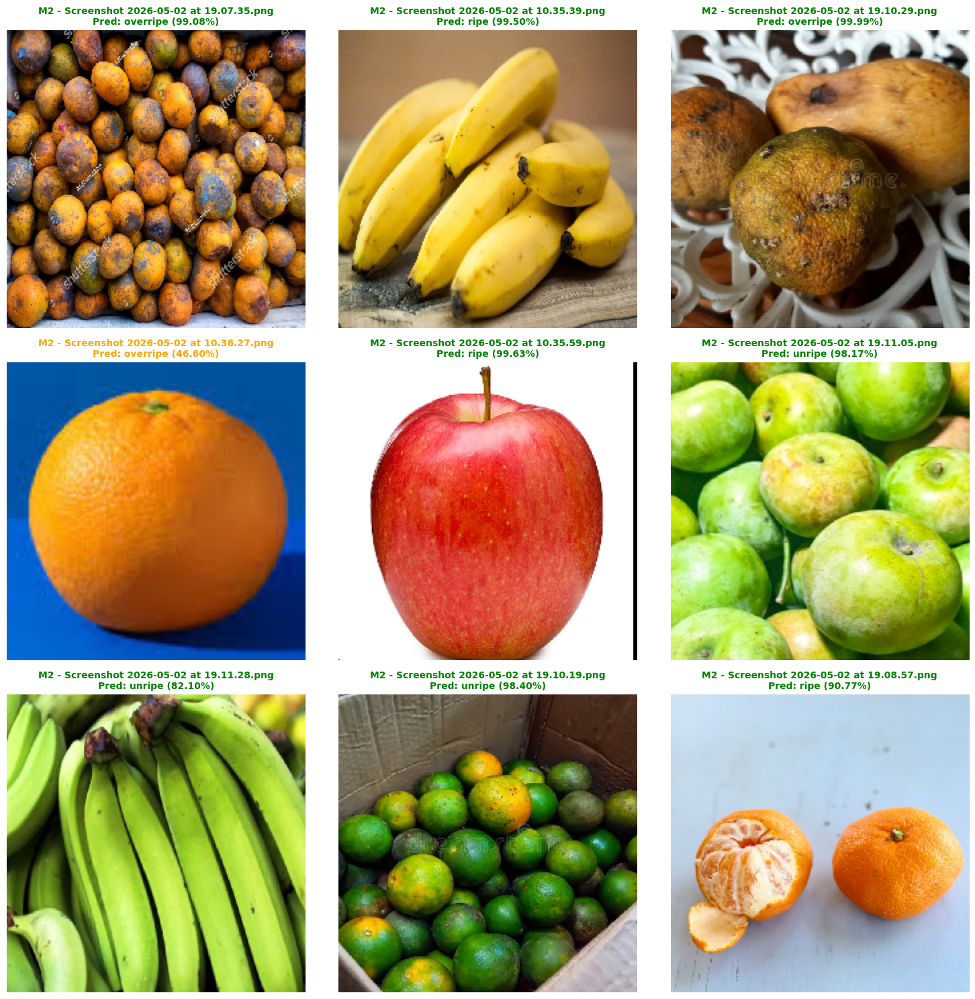

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import json # <--- PASTIKAN INI ADA

# --- 1. KONFIGURASI SPESIFIK MODEL 2 ---
MODEL_PATH_M2 = 'models/model_ripeness_finetuned.h5'
LABEL_PATH_M2 = 'models/class_indices_ripeness.json'
TEST_IMAGE_DIR = 'test_real_world/'
IMG_SIZE = (224, 224)
COLUMNS = 3 

# --- 2. LOAD MODEL & LABELS (DENGAN NAMA UNIK) ---
if os.path.exists(MODEL_PATH_M2) and os.path.exists(LABEL_PATH_M2):
    # Menggunakan nama 'model_ripeness' agar tidak menindih 'model' milik Model 1
    model_ripeness = tf.keras.models.load_model(MODEL_PATH_M2)
    with open(LABEL_PATH_M2, 'r') as f:
        class_indices_m2 = json.load(f)
    
    CLASS_LABELS_M2 = [k for k, v in sorted(class_indices_m2.items(), key=lambda item: item[1])]
    print(f"[SUCCESS] Model 2 (Ripeness) '{CLASS_LABELS_M2}' berhasil dimuat.")
else:
    print(f"[ERROR] File Model 2 atau JSON tidak ditemukan!")

# --- 3. EKSEKUSI (Gunakan variabel _M2) ---
test_files = [f for f in os.listdir(TEST_IMAGE_DIR) if f.endswith(('.jpg', '.png', '.jpeg', '.avif'))]

if len(test_files) > 0:
    num_images = len(test_files)
    rows = math.ceil(num_images / COLUMNS)
    fig, axes = plt.subplots(rows, COLUMNS, figsize=(15, 5 * rows))
    axes = axes.flatten() if num_images > 1 else [axes]

    for i, file in enumerate(test_files):
        img_path = os.path.join(TEST_IMAGE_DIR, file)
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=IMG_SIZE)
        img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        
        # Prediksi menggunakan model_ripeness
        predictions = model_ripeness.predict(img_array, verbose=0)
        class_idx = np.argmax(predictions)
        result_label = CLASS_LABELS_M2[class_idx]
        confidence = np.max(predictions) * 100
        
        axes[i].imshow(img)
        color = 'green' if confidence > 80 else 'orange'
        axes[i].set_title(f"M2 - {file}\nPred: {result_label} ({confidence:.2f}%)", 
                          fontsize=10, color=color, fontweight='bold')
        axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

[SUCCESS] Model 3 (Freshness) berhasil dimuat.
Indeks Label: {'fresh': 0, 'unfresh': 1}
[INFO] Memproses 9 gambar untuk pengecekan Kesegaran...


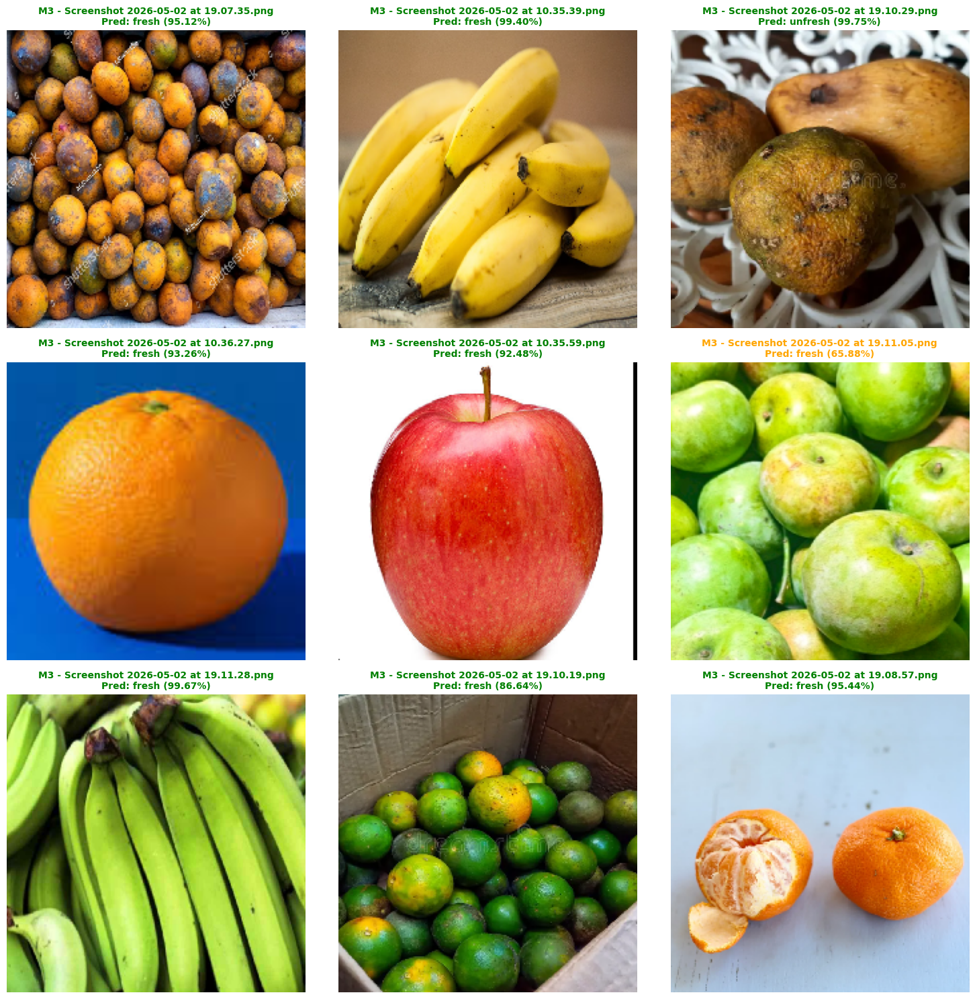

In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import json

# --- 1. KONFIGURASI SPESIFIK MODEL 3 (FRESHNESS) ---
MODEL_PATH_M3 = 'models/model_freshness_best.h5'
LABEL_PATH_M3 = 'models/class_indices_freshness.json'
TEST_IMAGE_DIR = 'test_real_world/' # Menggunakan folder yang sama
IMG_SIZE = (224, 224)
COLUMNS = 3 

# --- 2. LOAD MODEL & LABELS (DENGAN NAMA UNIK M3) ---
if os.path.exists(MODEL_PATH_M3) and os.path.exists(LABEL_PATH_M3):
    # Memuat model freshness (Sigmoid)
    model_freshness = tf.keras.models.load_model(MODEL_PATH_M3)
    with open(LABEL_PATH_M3, 'r') as f:
        class_indices_m3 = json.load(f)
    
    # Mapping label: {0: 'fresh', 1: 'unfresh'} atau sebaliknya sesuai JSON
    CLASS_LABELS_M3 = {v: k for k, v in class_indices_m3.items()}
    print(f"[SUCCESS] Model 3 (Freshness) berhasil dimuat.")
    print(f"Indeks Label: {class_indices_m3}")
else:
    print(f"[ERROR] File Model 3 atau JSON tidak ditemukan di folder 'models/'!")

# --- 3. EKSEKUSI PENGUJIAN & VISUALISASI ---
test_files = [f for f in os.listdir(TEST_IMAGE_DIR) if f.endswith(('.jpg', '.png', '.jpeg', '.avif'))]

if len(test_files) > 0:
    num_images = len(test_files)
    rows = math.ceil(num_images / COLUMNS)
    fig, axes = plt.subplots(rows, COLUMNS, figsize=(15, 5 * rows))
    axes = axes.flatten() if num_images > 1 else [axes]

    print(f"[INFO] Memproses {num_images} gambar untuk pengecekan Kesegaran...")

    for i, file in enumerate(test_files):
        img_path = os.path.join(TEST_IMAGE_DIR, file)
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=IMG_SIZE)
        img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        
        # Prediksi menggunakan model_freshness (Output: 0.0 - 1.0)
        prediction_score = model_freshness.predict(img_array, verbose=0)[0][0]
        
        # Logika Binary: Threshold 0.5
        # Jika score > 0.5 berarti kelas indeks 1, jika <= 0.5 kelas indeks 0
        class_idx = 1 if prediction_score > 0.5 else 0
        result_label = CLASS_LABELS_M3[class_idx]
        
        # Menghitung persentase keyakinan
        # Jika hasil > 0.5, confidence adalah skor tersebut. Jika < 0.5, confidence adalah (1 - skor)
        confidence = prediction_score * 100 if class_idx == 1 else (1 - prediction_score) * 100
        
        axes[i].imshow(img)
        # Warna teks: hijau jika yakin (>80%), orange jika ragu
        color = 'green' if confidence > 80 else 'orange'
        axes[i].set_title(f"M3 - {file}\nPred: {result_label} ({confidence:.2f}%)", 
                          fontsize=10, color=color, fontweight='bold')
        axes[i].axis('off')

    # Sembunyikan sisa kotak kosong pada grid
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print(f"[WARNING] Tidak ada file gambar di folder '{TEST_IMAGE_DIR}'.")